# N26 Stratascratch Project

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statistics


In [2]:
#load data set

mcc = pd.read_csv('mcc_group_definition.csv')
transaction = pd.read_csv('transaction_types.csv')
data = pd.read_csv('transactions_data_training.csv')

In [3]:
mcc

,mcc_group,explanation
0,1,ATM
1,2,Groceries
2,3,Gastronomie
3,4,Shopping/(Fashion)
4,5,"Home and DIY, House Energy"
5,6,Travel/Hotel
6,7,Transport
7,8,Automotive/Gas
8,9,Family/Babies/Children
9,10,Entertainment/Leisure


In [4]:
transaction

,type,explanation,direction,agent
0,AR,Authorization reject,-,Card
1,AE,Authorization expired,In,Card
2,AV,Authorization Reversal,In,Card
3,BBU,Cash26 deposit,In,Partner
4,CT,Credit Transfer,In,Bank Account
5,DI,Dispute,In,Card
6,DR,Debit Reversal,In,Bank Account
7,PF,Credit Card refund by merchant,In,Card
8,PR,Presentment Reversal,In,Card
9,WU,Referral payment,In,Number26


In [5]:
data

,user_id,transaction_date,transaction_type,mcc_group,amount_n26_currency,dataset_transaction,dataset_user
0,a78884f5e76951188c1e719d4956773a,2/1/16,DT,NaN,350,training,training
1,b0333294fef6ff1299102a70ad46b126,2/1/16,DT,NaN,202,training,training
2,7b8d2a2780adae0cd0c248e92c1b28dc,2/1/16,DT,NaN,291,training,training
3,cc4abaa500f7db4390ae3f02bd36d805,2/1/16,DT,NaN,214,training,training
4,49b99d1d5ba028566639e8b3eb7c055b,2/1/16,DT,NaN,272,training,training
...,...,...,...,...,...,...,...
408541,bc639c7495889105713fc6b1025264ac,7/31/16,DT,NaN,5,training,training
408542,0dfb685e3d705957ef9e0c472604b067,7/31/16,DT,NaN,155,training,training
408543,918eb93c2d3b084614e3570886715f84,7/31/16,DT,NaN,19,training,training
408544,918eb93c2d3b084614e3570886715f84,7/31/16,DT,NaN,19,training,training


In [6]:
transaction= transaction.rename({'type':'transaction_type', 'explanation':'trans_desc', 'direction':'direction', 'agent':'agent'}, axis=1)


## next we do is to merge the data into one data for the next step of visualization and cleaning

In [7]:
df1 = pd.merge(data, mcc, on='mcc_group', how='left')
df1


,user_id,transaction_date,transaction_type,mcc_group,amount_n26_currency,dataset_transaction,dataset_user,explanation
0,a78884f5e76951188c1e719d4956773a,2/1/16,DT,NaN,350,training,training,NaN
1,b0333294fef6ff1299102a70ad46b126,2/1/16,DT,NaN,202,training,training,NaN
2,7b8d2a2780adae0cd0c248e92c1b28dc,2/1/16,DT,NaN,291,training,training,NaN
3,cc4abaa500f7db4390ae3f02bd36d805,2/1/16,DT,NaN,214,training,training,NaN
4,49b99d1d5ba028566639e8b3eb7c055b,2/1/16,DT,NaN,272,training,training,NaN
...,...,...,...,...,...,...,...,...
408541,bc639c7495889105713fc6b1025264ac,7/31/16,DT,NaN,5,training,training,NaN
408542,0dfb685e3d705957ef9e0c472604b067,7/31/16,DT,NaN,155,training,training,NaN
408543,918eb93c2d3b084614e3570886715f84,7/31/16,DT,NaN,19,training,training,NaN
408544,918eb93c2d3b084614e3570886715f84,7/31/16,DT,NaN,19,training,training,NaN


In [8]:
df2 = pd.merge(df1, transaction, on='transaction_type', how ='left' )
df2

,user_id,transaction_date,transaction_type,mcc_group,amount_n26_currency,dataset_transaction,dataset_user,explanation,trans_desc,direction,agent
0,a78884f5e76951188c1e719d4956773a,2/1/16,DT,NaN,350,training,training,NaN,Debit Transfer,Out,Bank Account
1,b0333294fef6ff1299102a70ad46b126,2/1/16,DT,NaN,202,training,training,NaN,Debit Transfer,Out,Bank Account
2,7b8d2a2780adae0cd0c248e92c1b28dc,2/1/16,DT,NaN,291,training,training,NaN,Debit Transfer,Out,Bank Account
3,cc4abaa500f7db4390ae3f02bd36d805,2/1/16,DT,NaN,214,training,training,NaN,Debit Transfer,Out,Bank Account
4,49b99d1d5ba028566639e8b3eb7c055b,2/1/16,DT,NaN,272,training,training,NaN,Debit Transfer,Out,Bank Account
...,...,...,...,...,...,...,...,...,...,...,...
408541,bc639c7495889105713fc6b1025264ac,7/31/16,DT,NaN,5,training,training,NaN,Debit Transfer,Out,Bank Account
408542,0dfb685e3d705957ef9e0c472604b067,7/31/16,DT,NaN,155,training,training,NaN,Debit Transfer,Out,Bank Account
408543,918eb93c2d3b084614e3570886715f84,7/31/16,DT,NaN,19,training,training,NaN,Debit Transfer,Out,Bank Account
408544,918eb93c2d3b084614e3570886715f84,7/31/16,DT,NaN,19,training,training,NaN,Debit Transfer,Out,Bank Account


## from data we can see that the null value in data in mcc group and we want to see the correlation of it toward the transaction type to fill the null value is create a new type of mcc group 18 and name it "Others"

In [9]:
df2['mcc_group']= df2['mcc_group'].fillna(18)
df2['explanation'] = df2['explanation'].fillna('Others')

In [10]:
df2

,user_id,transaction_date,transaction_type,mcc_group,amount_n26_currency,dataset_transaction,dataset_user,explanation,trans_desc,direction,agent
0,a78884f5e76951188c1e719d4956773a,2/1/16,DT,18.0,350,training,training,Others,Debit Transfer,Out,Bank Account
1,b0333294fef6ff1299102a70ad46b126,2/1/16,DT,18.0,202,training,training,Others,Debit Transfer,Out,Bank Account
2,7b8d2a2780adae0cd0c248e92c1b28dc,2/1/16,DT,18.0,291,training,training,Others,Debit Transfer,Out,Bank Account
3,cc4abaa500f7db4390ae3f02bd36d805,2/1/16,DT,18.0,214,training,training,Others,Debit Transfer,Out,Bank Account
4,49b99d1d5ba028566639e8b3eb7c055b,2/1/16,DT,18.0,272,training,training,Others,Debit Transfer,Out,Bank Account
...,...,...,...,...,...,...,...,...,...,...,...
408541,bc639c7495889105713fc6b1025264ac,7/31/16,DT,18.0,5,training,training,Others,Debit Transfer,Out,Bank Account
408542,0dfb685e3d705957ef9e0c472604b067,7/31/16,DT,18.0,155,training,training,Others,Debit Transfer,Out,Bank Account
408543,918eb93c2d3b084614e3570886715f84,7/31/16,DT,18.0,19,training,training,Others,Debit Transfer,Out,Bank Account
408544,918eb93c2d3b084614e3570886715f84,7/31/16,DT,18.0,19,training,training,Others,Debit Transfer,Out,Bank Account


## After doing some left join, we checked for null value and unique value what to do next is some visualization to detect pattern and spot if there is any data transforming or scaling or cleaning is needed


### CLT of target data

/var/folders/_v/f8t16ncj18bdzf3ss6_9n9400000gn/T/ipykernel_61444/1142383575.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df2['amount_n26_currency'],  kde = True)


<Figure size 1000x600 with 0 Axes>

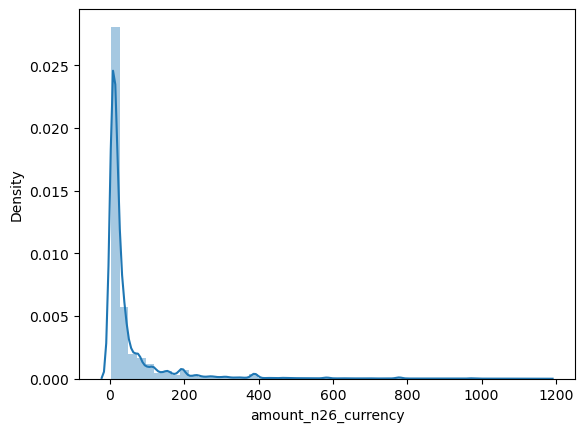

<Figure size 1000x600 with 0 Axes>

In [11]:
sns.distplot(df2['amount_n26_currency'],  kde = True)
plt.figure(figsize=(10,6))

### count of explaination

<Figure size 1000x600 with 0 Axes>

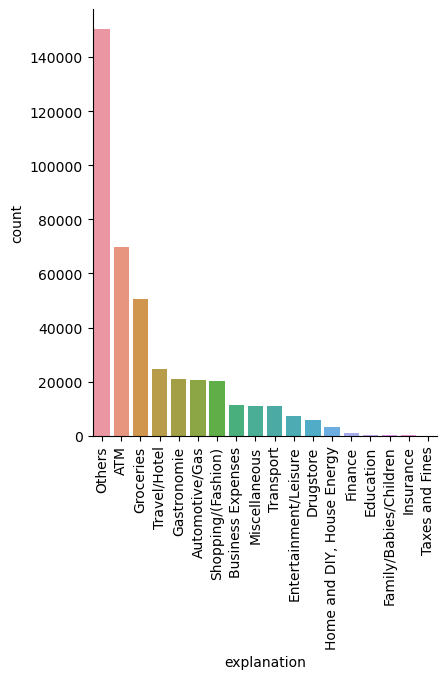

In [16]:
plt.figure(figsize=(10, 6))
plot = sns.catplot(x='explanation', data=df2, order = df2['explanation'].value_counts().index, kind='count')
plot.set_xticklabels(rotation=90)
plt.show()

### count by agent

<Figure size 1000x600 with 0 Axes>

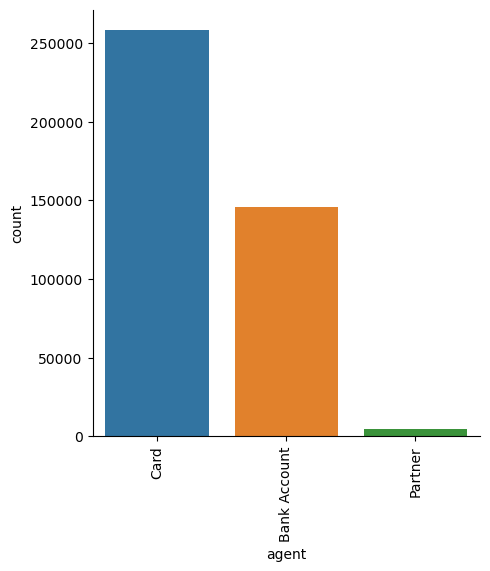

In [18]:
plt.figure(figsize=(10, 6))
plot = sns.catplot(x='agent', data=df2, order = df2['agent'].value_counts().index, kind='count')
plot.set_xticklabels(rotation=90)
plt.show()

### count of direction

<Figure size 1000x600 with 0 Axes>

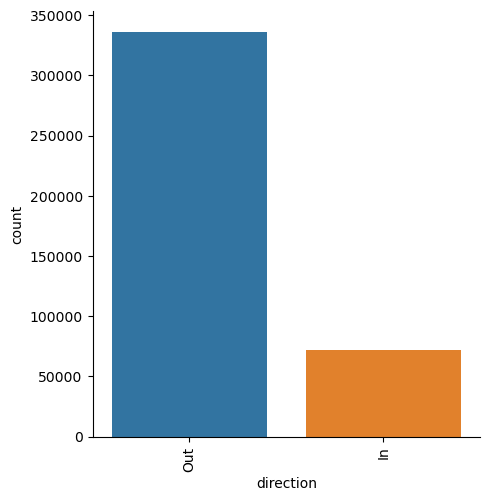

In [19]:
plt.figure(figsize=(10, 6))
plot = sns.catplot(x='direction', data=df2, order = df2['direction'].value_counts().index, kind='count')
plot.set_xticklabels(rotation=90)
plt.show()


In [31]:
df2['transaction_date'] = pd.to_datetime(df2['transaction_date'])


### Total Money Spend Daily by Direction

<Figure size 1000x500 with 0 Axes>

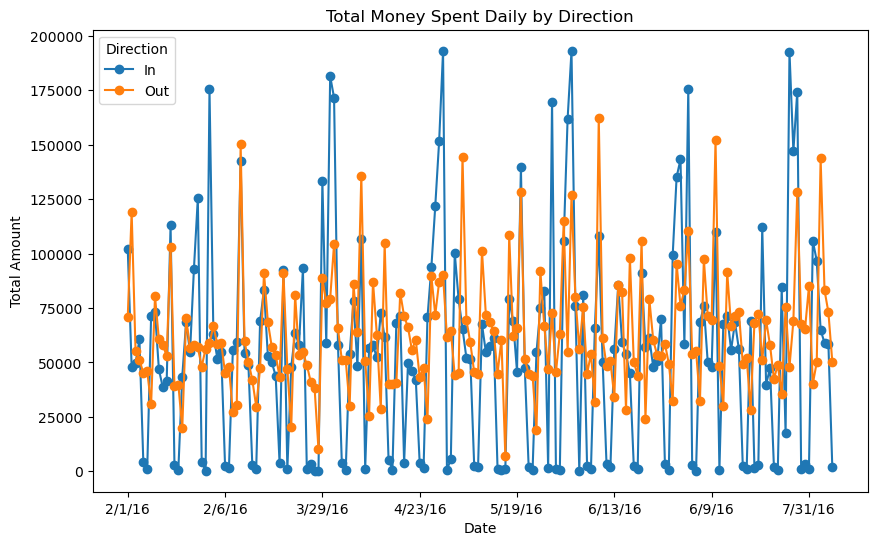

In [27]:
money_spent_daily = df2.groupby(['transaction_date', 'direction'])['amount_n26_currency'].sum().unstack()
money_spent_daily.plot(figsize=(10, 6), marker='o')
plt.title('Total Money Spent Daily by Direction')
plt.xlabel('Date')
plt.ylabel('Total Amount')
plt.legend(title='Direction')
plt.show()

### Weekly trend of usage

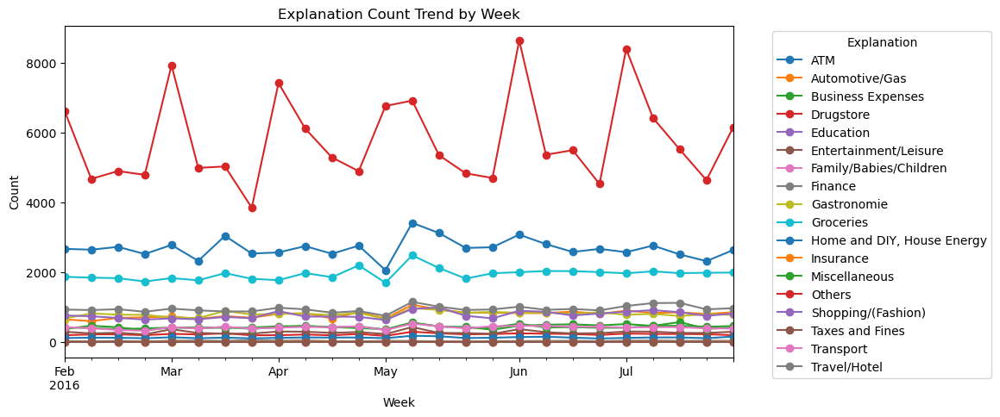

In [34]:
explanation_count_weekly = df2.groupby([pd.Grouper(key='transaction_date', freq='W'), 'explanation']).size().unstack(fill_value=0)
explanation_count_weekly.plot(figsize=(10, 5), marker='o')
plt.title('Explanation Count Trend by Week')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(title='Explanation',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Weekly Trend of Money transfer method

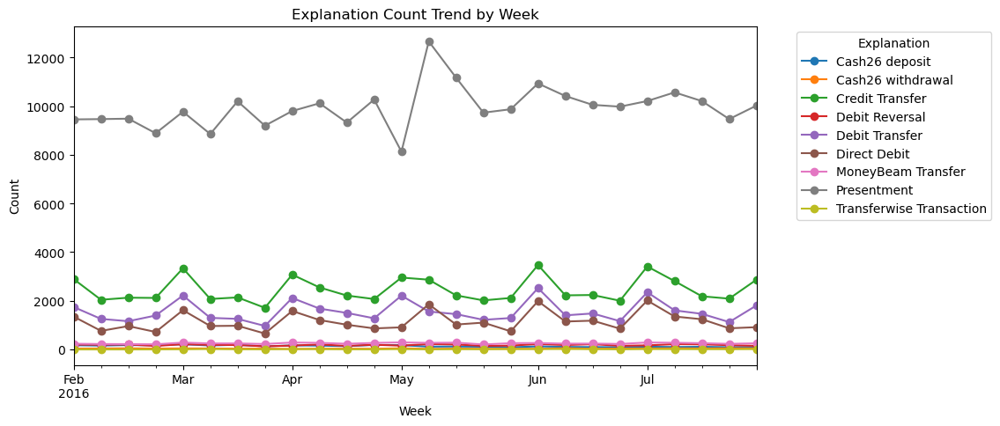

In [35]:
explanation_count_weekly = df2.groupby([pd.Grouper(key='transaction_date', freq='W'), 'trans_desc']).size().unstack(fill_value=0)
explanation_count_weekly.plot(figsize=(10, 5), marker='o')
plt.title('Explanation Count Trend by Week')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(title='Explanation',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Total transaction count by Week

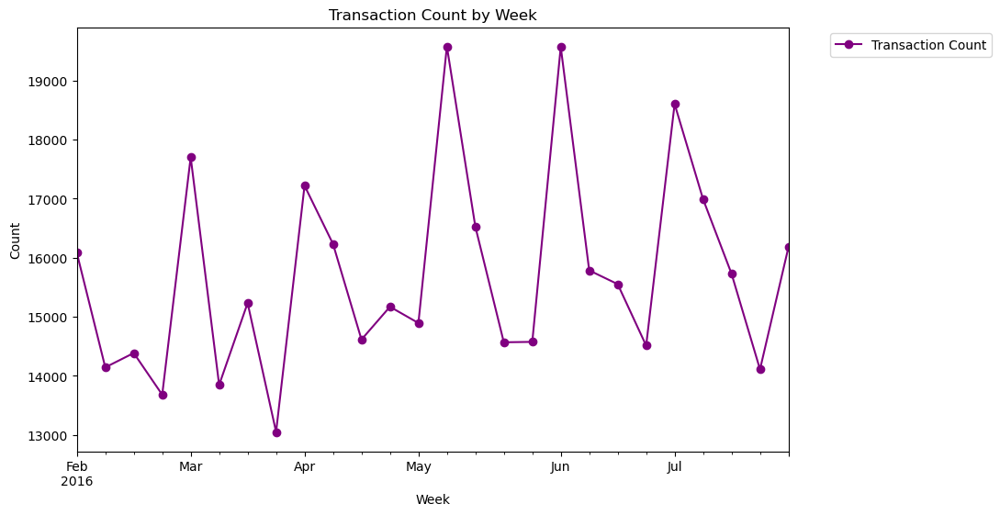

In [36]:
transaction_count_weekly = df2.groupby(pd.Grouper(key='transaction_date', freq='W')).size()
ax = transaction_count_weekly.plot(figsize=(10, 6), marker='o', color='purple')
plt.title('Transaction Count by Week')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(['Transaction Count'], bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## From this, after learning from the visualization, next step is to clean data and the analysis we want to apply is time series which we will not require multiple variable for the analysis. In this case we will focus in splitting data into "Money In" and "Money Out" for different analysis of each data

In [39]:
model_df = df2[['user_id','transaction_date', 'amount_n26_currency','direction']]

In [40]:
one_hot = pd.get_dummies(model_df[['direction']])

one_hot = one_hot.astype(int)

model_df = pd.concat([model_df, one_hot],axis =1)

model_df = model_df.drop([ 'direction'], axis = 1)

In [64]:
model_df['transaction_date'] = pd.to_datetime(model_df['transaction_date'])

# Split data into Money In and Money Out
money_in = model_df[model_df['direction_In'] == 1]
money_out = model_df[model_df['direction_Out'] == 1]

money_in = money_in.drop(['direction_In','direction_Out'], axis = 1)
money_out = money_out.drop(['direction_In','direction_Out'], axis = 1)

In [65]:
money_in

,user_id,transaction_date,amount_n26_currency
200,77a52d4da43d0106d321cdc1364bfe01,2016-02-01,24
206,f70f8ff785fac332a46323ab174082e2,2016-02-01,38
207,878fb2c5de84f1508129949e44b9820c,2016-02-01,34
208,208da7525d6b020c9c4272025be11ddc,2016-02-01,21
209,53a8dec0c1e388dfb13ce4ab5f85d4d5,2016-02-01,94
...,...,...,...
408518,e94987206df5e0c0dee2d0d68ff356c4,2016-07-31,11
408521,a6308afdc749eb49d5dd1c33d37b30ea,2016-07-31,48
408531,746c33f698d71fbd586d6dc4666b6bac,2016-07-31,311
408536,6f4bee554490392f17c6d090d4bf7aed,2016-07-31,42


In [66]:
money_out

,user_id,transaction_date,amount_n26_currency
0,a78884f5e76951188c1e719d4956773a,2016-02-01,350
1,b0333294fef6ff1299102a70ad46b126,2016-02-01,202
2,7b8d2a2780adae0cd0c248e92c1b28dc,2016-02-01,291
3,cc4abaa500f7db4390ae3f02bd36d805,2016-02-01,214
4,49b99d1d5ba028566639e8b3eb7c055b,2016-02-01,272
...,...,...,...
408541,bc639c7495889105713fc6b1025264ac,2016-07-31,5
408542,0dfb685e3d705957ef9e0c472604b067,2016-07-31,155
408543,918eb93c2d3b084614e3570886715f84,2016-07-31,19
408544,918eb93c2d3b084614e3570886715f84,2016-07-31,19


In [111]:
money_in = money_in.sort_values(['user_id','transaction_date']).reset_index(drop=True)
money_out = money_out.sort_values(['user_id','transaction_date']).reset_index(drop=True)


### To create train and test, with date ends on July 31st, we will use a whole July as testing and the rest will be for training

In [112]:
money_in_train = money_in[money_in['transaction_date'].dt.month < 7].reset_index(drop=True)
money_in_test = money_in[money_in['transaction_date'].dt.month >= 7].reset_index(drop=True)

money_out_train = money_out[money_out['transaction_date'].dt.month < 7].reset_index(drop=True)
money_out_test = money_out[money_out['transaction_date'].dt.month >= 7].reset_index(drop=True)

## For creating time series analysis, we have to encode time and also create lag feature 

In [113]:
def encode_time(df):
    df['transaction_date'] = pd.to_datetime(df['transaction_date'])
    df['year'] = df['transaction_date'].dt.year
    df['month'] = df['transaction_date'].dt.month
    df['day'] = df['transaction_date'].dt.day
    df['weekday'] = df['transaction_date'].dt.weekday
    return df

money_in_train = encode_time(money_in_train)
money_in_test = encode_time(money_in_test)
money_out_train = encode_time(money_out_train)
money_out_test = encode_time(money_out_test)


In [114]:
def create_lag_features_grouped_by_user(df, lag_features, lag_periods):
    for feature in lag_features:
        for period in lag_periods:
            df[f"{feature}_lag_{period}"] = df.groupby('user_id')[feature].shift(periods=period)
    return df

lag_features = ['amount_n26_currency'] 
lag_periods = [1, 3, 5]  

money_in_train = create_lag_features_grouped_by_user(money_in_train, lag_features, lag_periods)
money_in_test = create_lag_features_grouped_by_user(money_in_test, lag_features, lag_periods)
money_out_train = create_lag_features_grouped_by_user(money_out_train, lag_features, lag_periods)
money_out_test = create_lag_features_grouped_by_user(money_out_test, lag_features, lag_periods)



In [115]:
money_in_train

,user_id,transaction_date,amount_n26_currency,year,month,day,weekday,amount_n26_currency_lag_1,amount_n26_currency_lag_3,amount_n26_currency_lag_5
0,000295594379774ab9ac2c78c946d615,2016-02-19,291,2016,2,19,4,NaN,NaN,NaN
1,000295594379774ab9ac2c78c946d615,2016-03-09,381,2016,3,9,2,291.0,NaN,NaN
2,000295594379774ab9ac2c78c946d615,2016-05-10,155,2016,5,10,1,381.0,NaN,NaN
3,000295594379774ab9ac2c78c946d615,2016-06-03,115,2016,6,3,4,155.0,291.0,NaN
4,000aa792d73dd82b16a29692772d395a,2016-05-09,77,2016,5,9,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
60092,fffde1ba10b4040deb651162f56c9fc4,2016-05-03,389,2016,5,3,1,194.0,194.0,194.0
60093,fffde1ba10b4040deb651162f56c9fc4,2016-05-10,58,2016,5,10,1,389.0,35.0,19.0
60094,fffde1ba10b4040deb651162f56c9fc4,2016-05-29,6,2016,5,29,6,58.0,194.0,194.0
60095,fffde1ba10b4040deb651162f56c9fc4,2016-06-02,194,2016,6,2,3,6.0,389.0,35.0


In [132]:
money_in_train

,user_id,transaction_date,amount_n26_currency,year,month,day,weekday,amount_n26_currency_lag_1,amount_n26_currency_lag_3,amount_n26_currency_lag_5
0,000295594379774ab9ac2c78c946d615,2016-02-19,291,2016,2,19,4,NaN,NaN,NaN
1,000295594379774ab9ac2c78c946d615,2016-03-09,381,2016,3,9,2,291.0,NaN,NaN
2,000295594379774ab9ac2c78c946d615,2016-05-10,155,2016,5,10,1,381.0,NaN,NaN
3,000295594379774ab9ac2c78c946d615,2016-06-03,115,2016,6,3,4,155.0,291.0,NaN
4,000aa792d73dd82b16a29692772d395a,2016-05-09,77,2016,5,9,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
60092,fffde1ba10b4040deb651162f56c9fc4,2016-05-03,389,2016,5,3,1,194.0,194.0,194.0
60093,fffde1ba10b4040deb651162f56c9fc4,2016-05-10,58,2016,5,10,1,389.0,35.0,19.0
60094,fffde1ba10b4040deb651162f56c9fc4,2016-05-29,6,2016,5,29,6,58.0,194.0,194.0
60095,fffde1ba10b4040deb651162f56c9fc4,2016-06-02,194,2016,6,2,3,6.0,389.0,35.0


## Train and test data with XGBRegressor, and for target we will normalize the target value to achieve the central limit theorem 

In [157]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_log_error, mean_absolute_error

In [158]:
X_train = money_in_train[['year','month','day','weekday','amount_n26_currency_lag_1','amount_n26_currency_lag_3','amount_n26_currency_lag_5']]
X_test = money_in_test[['year','month','day','weekday','amount_n26_currency_lag_1','amount_n26_currency_lag_3','amount_n26_currency_lag_5']]
y_train = np.log((money_in_train['amount_n26_currency']))
y_test = np.log((money_in_test['amount_n26_currency']))

In [159]:
model = XGBRegressor(n_estimators=100)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [160]:
y_pred = model.predict(X_test)

In [164]:
np.sqrt(mean_squared_error(y_test, y_pred))

1.3596839195944508

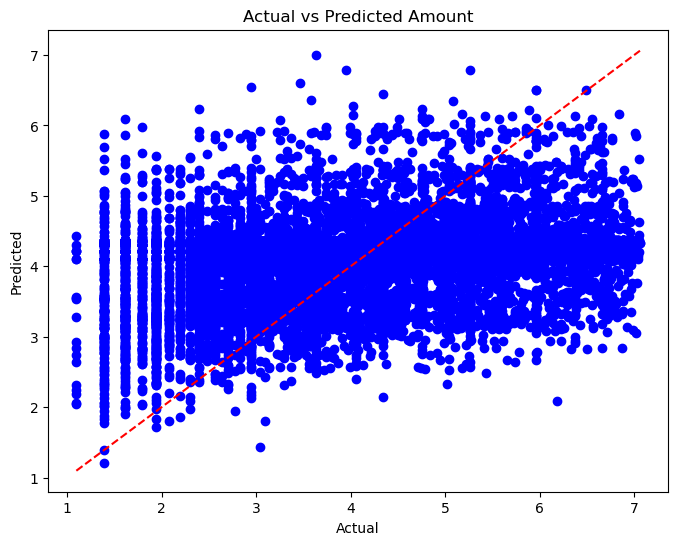

In [130]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Plotting the diagonal line
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted Amount')
plt.show()

In [176]:
import plotly.graph_objs as go
import plotly.express as px

comparison_df = pd.DataFrame({
    'date': money_in_test['transaction_date'],
    'actual': np.power(np.e, y_test),
    'predicted': np.power(np.e, y_pred)})

comparison_df['date'] = pd.to_datetime(comparison_df['date'])

comparison_df = comparison_df.sort_values('date')

trace_actual = go.Scatter(x=comparison_df['date'], y=comparison_df['actual'], mode='lines', name='Actual')
trace_predicted = go.Scatter(x=comparison_df['date'], y=comparison_df['predicted'], mode='lines', name='Predicted')

fig = go.Figure([trace_actual, trace_predicted])

fig.update_layout(hovermode='x')

fig.show()

## With the results, we can see that there are still error due to some outlier of the money in data. Hoever with the current error rate we can tuning by grid search and later will Cross validation it

In [177]:
X_train2 = money_out_train[['year','month','day','weekday','amount_n26_currency_lag_1','amount_n26_currency_lag_3','amount_n26_currency_lag_5']]
X_test2 = money_out_test[['year','month','day','weekday','amount_n26_currency_lag_1','amount_n26_currency_lag_3','amount_n26_currency_lag_5']]
y_train2 = np.log((money_out_train['amount_n26_currency']))
y_test2 = np.log((money_out_test['amount_n26_currency']))

In [178]:
model = XGBRegressor(n_estimators=100)
model.fit(X_train2, y_train2)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [181]:
y_pred2 = model.predict(X_test2)

In [182]:
np.sqrt(mean_squared_error(y_test2, y_pred2))

1.0581547328319756

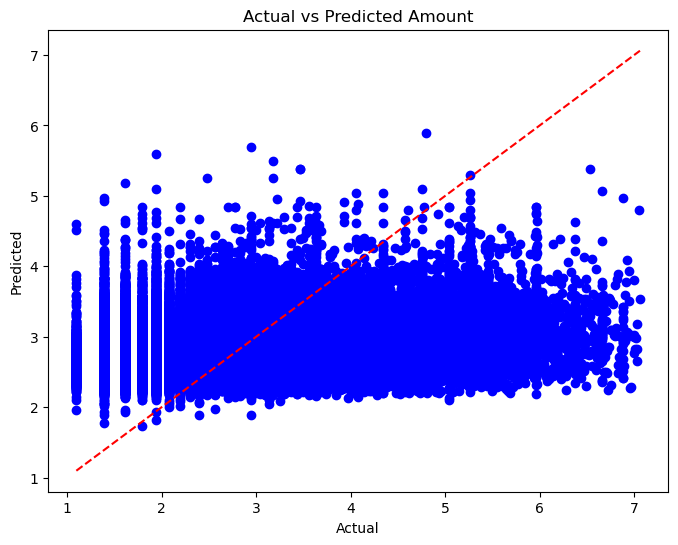

In [183]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test2, y_pred2, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Plotting the diagonal line
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted Amount')
plt.show()

In [184]:
import plotly.graph_objs as go
import plotly.express as px

comparison_df = pd.DataFrame({
    'date': money_out_test['transaction_date'],
    'actual': np.power(np.e, y_test2),
    'predicted': np.power(np.e, y_pred2)})

comparison_df['date'] = pd.to_datetime(comparison_df['date'])

comparison_df = comparison_df.sort_values('date')

trace_actual = go.Scatter(x=comparison_df['date'], y=comparison_df['actual'], mode='lines', name='Actual')
trace_predicted = go.Scatter(x=comparison_df['date'], y=comparison_df['predicted'], mode='lines', name='Predicted')

fig = go.Figure([trace_actual, trace_predicted])

fig.update_layout(hovermode='x')

fig.show()

## The result seems to be better on the money out data, however we will also perform the same process

# DUE TO LIMITED TIME TO WORK ON THIS, THE CURRENT RESULT WILL BE UPDATED LATER